In [1]:
import numpy as np
import pandas as pd
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)
import scipy as sp
import seaborn as sns
sns.set_palette('Set2')
import matplotlib.pyplot as plt
%matplotlib inline
import tensorflow as tf

from scipy import stats
from scipy.stats import randint

from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.datasets import make_classification
from sklearn.preprocessing import binarize, LabelEncoder, MinMaxScaler

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier

from sklearn import metrics
from sklearn.metrics import accuracy_score, mean_squared_error, precision_recall_curve
from sklearn.model_selection import cross_val_score

from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import RandomizedSearchCV

from sklearn.ensemble import BaggingClassifier, AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier

from sklearn.naive_bayes import GaussianNB 

from mlxtend.classifier import StackingClassifier

In [2]:
data = pd.read_csv('mental-heath-in-tech-2016_20161114.csv')
data

,Are you self-employed?,How many employees does your company or organization have?,Is your employer primarily a tech company/organization?,Is your primary role within your company related to tech/IT?,Does your employer provide mental health benefits as part of healthcare coverage?,Do you know the options for mental health care available under your employer-provided coverage?,"Has your employer ever formally discussed mental health (for example, as part of a wellness campaign or other official communication)?",Does your employer offer resources to learn more about mental health concerns and options for seeking help?,Is your anonymity protected if you choose to take advantage of mental health or substance abuse treatment resources provided by your employer?,"If a mental health issue prompted you to request a medical leave from work, asking for that leave would be:",Do you think that discussing a mental health disorder with your employer would have negative consequences?,Do you think that discussing a physical health issue with your employer would have negative consequences?,Would you feel comfortable discussing a mental health disorder with your coworkers?,Would you feel comfortable discussing a mental health disorder with your direct supervisor(s)?,Do you feel that your employer takes mental health as seriously as physical health?,Have you heard of or observed negative consequences for co-workers who have been open about mental health issues in your workplace?,Do you have medical coverage (private insurance or state-provided) which includes treatment of mental health issues?,Do you know local or online resources to seek help for a mental health disorder?,"If you have been diagnosed or treated for a mental health disorder, do you ever reveal this to clients or business contacts?","If you have revealed a mental health issue to a client or business contact, do you believe this has impacted you negatively?","If you have been diagnosed or treated for a mental health disorder, do you ever reveal this to coworkers or employees?","If you have revealed a mental health issue to a coworker or employee, do you believe this has impacted you negatively?",Do you believe your productivity is ever affected by a mental health issue?,"If yes, what percentage of your work time (time performing primary or secondary job functions) is affected by a mental health issue?",Do you have previous employers?,Have your previous employers provided mental health benefits?,Were you aware of the options for mental health care provided by your previous employers?,Did your previous employers ever formally discuss mental health (as part of a wellness campaign or other official communication)?,Did your previous employers provide resources to learn more about mental health issues and how to seek help?,Was your anonymity protected if you chose to take advantage of mental health or substance abuse treatment resources with previous employers?,Do you think that discussing a mental health disorder with previous employers would have negative consequences?,Do you think that discussing a physical health issue with previous employers would have negative consequences?,Would you have been willing to discuss a mental health issue with your previous co-workers?,Would you have been willing to discuss a mental health issue with your direct supervisor(s)?,Did you feel that your previous employers took mental health as seriously as physical health?,Did you hear of or observe negative consequences for co-workers with mental health issues in your previous workplaces?,Would you be willing to bring up a physical health issue with a potential employer in an interview?,Why or why not?,Would you bring up a mental health issue with a potential employer in an interview?,Why or why not?.1,Do you feel that being identified as a person with a mental health issue would hurt your career?,Do you think that team members/co-workers would view you more negatively if they knew you suffered from a menta

In [3]:
data.isna().mean()

Are you self-employed?                                                                                                                                                              0.000000
How many employees does your company or organization have?                                                                                                                          0.200279
Is your employer primarily a tech company/organization?                                                                                                                             0.200279
Is your primary role within your company related to tech/IT?                                                                                                                        0.816469
Does your employer provide mental health benefits as part of healthcare coverage?                                                                                                   0.200279
Do you know the options for mental health care availabl

In [4]:
count=0
major_not_ans=[]
for col in data:
    if(sum(pd.isnull(data[col]))>721):
        count=count+1
        major_not_ans.append(col)
print(len(major_not_ans))

13


In [5]:
data.drop([i for i in major_not_ans],axis=1,inplace=True)

In [6]:
extras=['What US state or territory do you work in?','Why or why not?','Why or why not?.1','What US state or territory do you live in?']
irrelevant=['Which of the following best describes your work position?']

In [7]:
data.drop([i for i in extras],axis=1,inplace=True)
data.drop(['Are you self-employed?'],axis=1,inplace=True)
data.drop(['Do you have previous employers?'],axis=1,inplace=True)
data.drop(irrelevant,axis=1,inplace=True)
data.drop(['What country do you live in?'],axis=1,inplace=True)

In [8]:
mental_health=(list(data))
print(len(mental_health))

42


In [9]:
count=0
for index,col in enumerate(mental_health):
    idx=data.index[data[col].isnull()]
    if(len(idx)==287):
        k=idx
        count+=1
data.drop(k,inplace=True)
data.shape

(1146, 42)

In [10]:
count=0
for index,col in enumerate(mental_health):
    idx=data.index[data[col].isnull()]
    if(len(idx)==131):
        k=idx
        count+=1
data.drop(k,inplace=True)
data.shape

(1015, 42)

In [11]:
data['What is your gender?'] = data['What is your gender?'].replace([
    'male', 'Male ', 'M', 'm', 'man', 'Cis male',
    'Male.', 'Male (cis)', 'Man', 'Sex is male',
    'cis male', 'Malr', 'Dude', "I'm a man why didn't you make this a drop down question. You should of asked sex? And I would of answered yes please. Seriously how much text can this take? ",
    'mail', 'M|', 'male ', 'Cis Male', 'Male (trans, FtM)',
    'cisdude', 'cis man', 'MALE'], 'Male')
data['What is your gender?'] = data['What is your gender?'].replace([
    'female', 'I identify as female.', 'female ',
    'Female assigned at birth ', 'F', 'Woman', 'fm', 'f',
    'Cis female', 'Transitioned, M2F', 'Female or Multi-Gender Femme',
    'Female ', 'woman', 'female/woman', 'Cisgender Female', 
    'mtf', 'fem', 'Female (props for making this a freeform field, though)',
    ' Female', 'Cis-woman', 'AFAB', 'Transgender woman',
    'Cis female '], 'Female')
data['What is your gender?'] = data['What is your gender?'].replace([
    'Bigender', 'non-binary,', 'Genderfluid (born female)',
    'Other/Transfeminine', 'Androgynous', 'male 9:1 female, roughly',
    'nb masculine', 'genderqueer', 'Human', 'Genderfluid',
    'Enby', 'genderqueer woman', 'Queer', 'Agender', 'Fluid',
    'Genderflux demi-girl', 'female-bodied; no feelings about gender',
    'non-binary', 'Male/genderqueer', 'Nonbinary', 'Other', 'none of your business',
    'Unicorn', 'human', 'Genderqueer'], 'Genderqueer/Other')

In [12]:
data.loc[(data['What is your age?'] > 90), 'What is your age?'] = 34
data.loc[(data['What is your age?'] < 10), 'What is your age?'] = 34
data['What is your gender?'] = data['What is your gender?'].replace(np.NaN, 'Male')
data['What is your gender?'].value_counts()

Male                 749
Female               245
Genderqueer/Other     21
Name: What is your gender?, dtype: int64

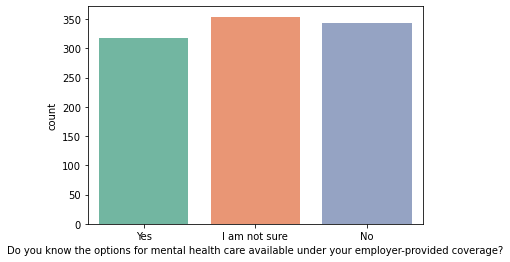

In [13]:
data.fillna(method='ffill',inplace=True)
data.fillna(value='Yes', limit=1,inplace=True)
g = sns.countplot(x='Do you know the options for mental health care available under your employer-provided coverage?',data=data)

In [14]:
for index,val in enumerate(mental_health):
    p=data[val].unique()
    print(index,val)
    print(p)
    print('\n')

0 How many employees does your company or organization have?
['26-100' '6-25' 'More than 1000' '100-500' '500-1000' '1-5']


1 Is your employer primarily a tech company/organization?
[1. 0.]


2 Does your employer provide mental health benefits as part of healthcare coverage?
['Not eligible for coverage / N/A' 'No' 'Yes' "I don't know"]


3 Do you know the options for mental health care available under your employer-provided coverage?
['Yes' 'I am not sure' 'No']


4 Has your employer ever formally discussed mental health (for example, as part of a wellness campaign or other official communication)?
['No' 'Yes' "I don't know"]


5 Does your employer offer resources to learn more about mental health concerns and options for seeking help?
['No' 'Yes' "I don't know"]


6 Is your anonymity protected if you choose to take advantage of mental health or substance abuse treatment resources provided by your employer?
["I don't know" 'Yes' 'No']


7 If a mental health issue prompted you to reque

In [15]:
country=(data[mental_health[40]].unique())
num_rep=[]
alp_rep=[]
for index,val in enumerate(country):
    num_rep.append(index)
    alp_rep.append(val)
print(len(num_rep),len(alp_rep))
data[mental_health[40]].replace(alp_rep, num_rep,inplace=True)

42 42


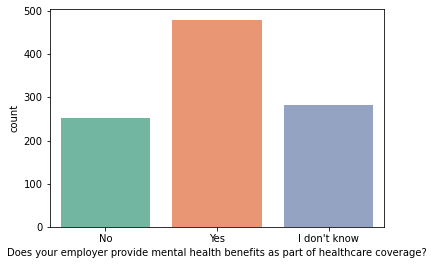

In [16]:
data['Does your employer provide mental health benefits as part of healthcare coverage?'] = data['Does your employer provide mental health benefits as part of healthcare coverage?'].replace('Not eligible for coverage / N/A','No')
g = sns.countplot(x='Does your employer provide mental health benefits as part of healthcare coverage?',data=data)

In [17]:
data['How many employees does your company or organization have?'] = data['How many employees does your company or organization have?'].replace('1-5', 5)
data['How many employees does your company or organization have?'] = data['How many employees does your company or organization have?'].replace('6-25',25)
data['How many employees does your company or organization have?'] = data['How many employees does your company or organization have?'].replace('26-100', 100)
data['How many employees does your company or organization have?'] = data['How many employees does your company or organization have?'].replace('100-500',500)
data['How many employees does your company or organization have?'] = data['How many employees does your company or organization have?'].replace('500-1000',1000)
data['How many employees does your company or organization have?'] = data['How many employees does your company or organization have?'].replace('More than 1000',5000)
data['How many employees does your company or organization have?'] = data['How many employees does your company or organization have?'].replace(np.nan,5)

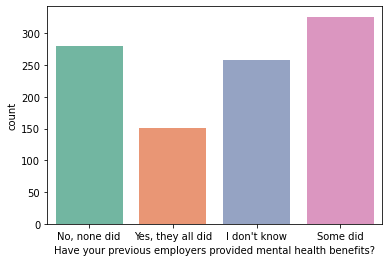

In [18]:
g = sns.countplot(x=data[mental_health[14]],data=data)

In [19]:
numeric = {mental_health[2]:     {'No':0, 'Yes':1, "I don't know":2},
                mental_health[3]: {'Yes':1, 'I am not sure':2, 'No':0},
                 mental_health[4]:{'No':0, 'Yes':1, "I don't know":2},
                  mental_health[5]:{'No':0, 'Yes':1, "I don't know":2},
                   mental_health[6]:{"I don't know":2, 'Yes':1, 'No':0},
                    mental_health[7]:{'Very easy':0 ,'Somewhat easy':1, 'Neither easy nor difficult':2,'Very difficult':-1,
 'Somewhat difficult':-2, "I don't know":2},
                mental_health[8]:{'No':0, 'Maybe':2, 'Yes':1},
                mental_health[9]:{'No':0, 'Maybe':2, 'Yes':1},
                 mental_health[10]:{'No':0, 'Maybe':2, 'Yes':1},
                 mental_health[11]:{'No':0, 'Maybe':2, 'Yes':1},
                 mental_health[12]:{"I don't know":2, 'Yes':1, 'No':0},
                 mental_health[13]:{'No':0, 'Yes':1},
                 mental_health[14]:{'No, none did':0, 'Yes, they all did':1, "I don't know":2, 'Some did':3},
                 mental_health[15]:{'N/A (not currently aware)':0, 'I was aware of some':1,
 'Yes, I was aware of all of them':1, 'No, I only became aware later':0},
                mental_health[16]:{"I don't know":2, 'None did':0, 'Some did':3,'Yes, they all did':1},
                mental_health[17]:{'None did':0, 'Some did':3, 'Yes, they all did':1},
                mental_health[18]:{"I don't know":2, 'Yes, always':1, 'Sometimes':3, 'No':0},
                mental_health[19]:{'Some of them':3, 'None of them':0, "I don't know":2, 'Yes, all of them':1},
                mental_health[20]:{'None of them':0, 'Some of them':3, 'Yes, all of them':1},
                mental_health[21]:{'Some of my previous employers':3, 'No, at none of my previous employers':0,
 'Yes, at all of my previous employers':1},
                mental_health[22]:{'Some of my previous employers':3, "I don't know":2, 'No, at none of my previous employers':0,
 'Yes, at all of my previous employers':1},
                mental_health[23]:{"I don't know":2, 'Some did':3, 'None did':0, 'Yes, they all did':1},
                mental_health[24]:{'None of them':0, 'Some of them':3, 'Yes, all of them':1},
                mental_health[25]:{'Maybe':2, 'Yes':1, 'No':0},
                mental_health[26]:{'Maybe':2, 'Yes':1, 'No':0},
                mental_health[27]:{'Maybe':2, "No, I don't think it would":0, 'Yes, I think it would':1,
 'No, it has not':0, 'Yes, it has':1},
                mental_health[28]:{"No, I don't think they would":0, 'Maybe':2, 'Yes, they do':1,'Yes, I think they would':1, 'No, they do not':0},  ## MODIFIED DIRECTLY
                mental_health[29]:{'Somewhat open':1, 'Not applicable to me (I do not have a mental illness)':4,
 'Very open':2, 'Not open at all':-2 ,'Neutral':0, 'Somewhat not open':-1},
                mental_health[30]:{'No':0, 'Maybe/Not sure':2, 'Yes, I experienced':1, 'Yes, I observed':1},
                mental_health[31]:{'No':0, 'Yes':1, "I don't know":2},
                mental_health[32]:{'Yes':1, 'Maybe':2, 'No':0},
                mental_health[33]:{'Yes':1, 'Maybe':2, 'No':0},
                mental_health[34]:{'Yes':1, 'No':0},
                mental_health[36]:{'Not applicable to me':4, 'Rarely':0, 'Sometimes':3, 'Never':0, 'Often':1},
                mental_health[37]:{'Not applicable to me':4, 'Sometimes':3, 'Often':1, 'Rarely':0, 'Never':0},
                mental_health[39]:{'Male':1, 'Female':0, 'Genderqueer/Other':2},
                mental_health[41]:{'Sometimes':3, 'Never':0, 'Always':1}
          }

In [20]:
data.replace(numeric, inplace=True)
data.head()

,How many employees does your company or organization have?,Is your employer primarily a tech company/organization?,Does your employer provide mental health benefits as part of healthcare coverage?,Do you know the options for mental health care available under your employer-provided coverage?,"Has your employer ever formally discussed mental health (for example, as part of a wellness campaign or other official communication)?",Does your employer offer resources to learn more about mental health concerns and options for seeking help?,Is your anonymity protected if you choose to take advantage of mental health or substance abuse treatment resources provided by your employer?,"If a mental health issue prompted you to request a medical leave from work, asking for that leave would be:",Do you think that discussing a mental health disorder with your employer would have negative consequences?,Do you think that discussing a physical health issue with your employer would have negative consequences?,Would you feel comfortable discussing a mental health disorder with your coworkers?,Would you feel comfortable discussing a mental health disorder with your direct supervisor(s)?,Do you feel that your employer takes mental health as seriously as physical health?,Have you heard of or observed negative consequences for co-workers who have been open about mental health issues in your workplace?,Have your previous employers provided mental health benefits?,Were you aware of the options for mental health care provided by your previous employers?,Did your previous employers ever formally discuss mental health (as part of a wellness campaign or other official communication)?,Did your previous employers provide resources to learn more about mental health issues and how to seek help?,Was your anonymity protected if you chose to take advantage of mental health or substance abuse treatment resources with previous employers?,Do you think that discussing a mental health disorder with previous employers would have negative consequences?,Do you think that discussing a physical health issue with previous employers would have negative consequences?,Would you have been willing to discuss a mental health issue with your previous co-workers?,Would you have been willing to discuss a mental health issue with your direct supervisor(s)?,Did you feel that your previous employers took mental health as seriously as physical health?,Did you hear of or observe negative consequences for co-workers with mental health issues in your previous workplaces?,Would you be willing to bring up a physical health issue with a potential employer in an interview?,Would you bring up a mental health issue with a potential employer in an interview?,Do you feel that being identified as a person with a mental health issue would hurt your career?,Do you think that team members/co-workers would view you more negatively if they knew you suffered from a mental health issue?,How willing would you be to share with friends and family that you have a mental illness?,Have you observed or experienced an unsupportive or badly handled response to a mental health issue in your current or previous workplace?,Do you have a family history of mental illness?,Have you had a mental health disorder in the past?,Do you currently have a mental health disorder?,Have you been diagnosed with a mental health condition by a medical professional?,Have you ever sought treatment for a mental health issue from a mental health professional?,"If you have a mental health issue, do you feel that it interferes with your work when being treated effectively?","If you have a mental health issue, do you feel that it interferes with your work when NOT being treated effectively?",What is your age?,What is your gender?,What country do you work in?,Do you work remotely?
0,100,1.0,0,1,0,0,2,0,0,0,2,1,2,0,0,0,2,0,2,3,0,3,3,2,0,2,2,2,0,1,0,0,1,0,1,0,4,4,39,1,0,3
1,25,1.0,0,1,1,1,1,1,0,0,2,1,1,0,1,1,0,3,1,0,0,0,3,3,0,2,0,0,0,1,0,1,1,1,1

In [21]:
df_rn_dt = {
    "How many employees does your company or organization have?":"no_of_employees",
    "Is your employer primarily a tech company/organization?":"Tech_company",
    "Does your employer provide mental health benefits as part of healthcare coverage?":"health_benefits",
    "Do you know the options for mental health care available under your employer-provided coverage?":"mhc_options",
    "Has your employer ever formally discussed mental health (for example, as part of a wellness campaign or other official communication)?":"mh_orientation",
    "Does your employer offer resources to learn more about mental health concerns and options for seeking help?":"cep_learn",
    "Is your anonymity protected if you choose to take advantage of mental health or substance abuse treatment resources provided by your employer?":"cep_anon",
    "If a mental health issue prompted you to request a medical leave from work, asking for that leave would be:":"cep_mh_leave",
    "Do you think that discussing a mental health disorder with your employer would have negative consequences?":"cep_mh_ncsq",
    "Do you think that discussing a physical health issue with your employer would have negative consequences?":"cep_ph_ncsq",
    "Would you feel comfortable discussing a mental health disorder with your coworkers?":"cep_comf_cw",
    "Would you feel comfortable discussing a mental health disorder with your direct supervisor(s)?":"cep_comf_sup",
    "Do you feel that your employer takes mental health as seriously as physical health?":"cep_serious",
    "Have you heard of or observed negative consequences for co-workers who have been open about mental health issues in your workplace?":"cep_others_ncsq",
    "Do you have previous employers?":"pep_have",
    "Have your previous employers provided mental health benefits?":"pep_benefits",
    "Were you aware of the options for mental health care provided by your previous employers?":"pep_know_options",
    "Did your previous employers ever formally discuss mental health (as part of a wellness campaign or other official communication)?":"pep_discuss",
    "Did your previous employers provide resources to learn more about mental health issues and how to seek help?":"pep_learn",
    "Was your anonymity protected if you chose to take advantage of mental health or substance abuse treatment resources with previous employers?":"pep_anon",
    "Do you think that discussing a mental health disorder with previous employers would have negative consequences?":"pep_mh_ncsq",
    "Do you think that discussing a physical health issue with previous employers would have negative consequences?":"pep_ph_ncsq",
    "Would you have been willing to discuss a mental health issue with your previous co-workers?":"pep_comf_cw",
    "Would you have been willing to discuss a mental health issue with your direct supervisor(s)?":"pep_comf_sup",
    "Did you feel that your previous employers took mental health as seriously as physical health?":"pep_serious",
    "Did you hear of or observe negative consequences for co-workers with mental health issues in your previous workplaces?":"pep_others_ncsq",
    "Would you be willing to bring up a physical health issue with a potential employer in an interview?":"fep_ph_willing",
    "Would you bring up a mental health issue with a potential employer in an interview?":"fep_mh_willing",
    "Do you feel that being identified as a person with a mental health issue would hurt your career?":"hurt_career",
    "Do you think that team members/co-workers would view you more negatively if they knew you suffered from a mental health issue?":"cw_view_neg",
    "How willing would you be to share with friends and family that you have a mental illness?":"comf_ff",
    "Have you observed or experienced an unsupportive or badly handled response to a mental health issue in your current or previous workplace?":"neg_response",
    "Do you have a family history of mental illness?":"mh_fam_hist",
    "Have you had a mental health disorder in the past?":"mh_hist",
    "Do you currently have a mental health disorder?":"mh_cur",
    "Have you been diagnosed with a mental health condition by a medical professional?":"mh_diag_pro",
    "Have you ever sought treatment for a mental health issue from a mental health professional?":"sought_treat",
    "If you have a mental health issue, do you feel that it interferes with your work when being treated effectively?":"work_affect_effect",
    "If you have a mental health issue, do you feel that it interferes with your work when NOT being treated effectively?":"work_affect_ineffect",
    "What is your age?":"Age",
    "What is your gender?":"Gender",
    "What country do you work in?":"work_country",
    "Do you work remotely?":"work_remote"
}

data=data.rename(columns=df_rn_dt)

In [22]:
labelDict = {}
for feature in data:
    le = preprocessing.LabelEncoder()
    le.fit(data[feature])
    le_name_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
    data[feature] = le.transform(data[feature])
    labelKey = 'label_' + feature
    labelValue = [*le_name_mapping]
    labelDict[labelKey] =labelValue
    
for key, value in labelDict.items():     
    print(key, value)

label_no_of_employees [5, 25, 100, 500, 1000, 5000]
label_Tech_company [0.0, 1.0]
label_health_benefits [0, 1, 2]
label_mhc_options [0, 1, 2]
label_mh_orientation [0, 1, 2]
label_cep_learn [0, 1, 2]
label_cep_anon [0, 1, 2]
label_cep_mh_leave [-2, -1, 0, 1, 2]
label_cep_mh_ncsq [0, 1, 2]
label_cep_ph_ncsq [0, 1, 2]
label_cep_comf_cw [0, 1, 2]
label_cep_comf_sup [0, 1, 2]
label_cep_serious [0, 1, 2]
label_cep_others_ncsq [0, 1]
label_pep_benefits [0, 1, 2, 3]
label_pep_know_options [0, 1]
label_pep_discuss [0, 1, 2, 3]
label_pep_learn [0, 1, 3]
label_pep_anon [0, 1, 2, 3]
label_pep_mh_ncsq [0, 1, 2, 3]
label_pep_ph_ncsq [0, 1, 3]
label_pep_comf_cw [0, 1, 3]
label_pep_comf_sup [0, 1, 2, 3]
label_pep_serious [0, 1, 2, 3]
label_pep_others_ncsq [0, 1, 3]
label_fep_ph_willing [0, 1, 2]
label_fep_mh_willing [0, 1, 2]
label_hurt_career [0, 1, 2]
label_cw_view_neg [0, 1, 2]
label_comf_ff [-2, -1, 0, 1, 2, 4]
label_neg_response [0, 1, 2]
label_mh_fam_hist [0, 1, 2]
label_mh_hist [0, 1, 2]
label_

In [23]:
data.head(2)

,no_of_employees,Tech_company,health_benefits,mhc_options,mh_orientation,cep_learn,cep_anon,cep_mh_leave,cep_mh_ncsq,cep_ph_ncsq,cep_comf_cw,cep_comf_sup,cep_serious,cep_others_ncsq,pep_benefits,pep_know_options,pep_discuss,pep_learn,pep_anon,pep_mh_ncsq,pep_ph_ncsq,pep_comf_cw,pep_comf_sup,pep_serious,pep_others_ncsq,fep_ph_willing,fep_mh_willing,hurt_career,cw_view_neg,comf_ff,neg_response,mh_fam_hist,mh_hist,mh_cur,mh_diag_pro,sought_treat,work_affect_effect,work_affect_ineffect,Age,Gender,work_country,work_remote
0,2,1,0,1,0,0,2,2,0,0,2,1,2,0,0,0,2,0,2,3,0,2,3,2,0,2,2,2,0,3,0,0,1,0,1,0,3,3,21,1,0,2
1,1,1,0,1,1,1,1,3,0,0,2,1,1,0,1,1,0,2,1,0,0,0,3,3,0,2,0,0,0,3,0,1,1,1,1,1,0,2,11,1,1,0


In [24]:
total = data.isnull().sum().sort_values(ascending=False)
percent = (data.isnull().sum()/data.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)
print(missing_data)

                      Total  Percent
work_remote               0      0.0
cep_comf_cw               0      0.0
pep_anon                  0      0.0
pep_learn                 0      0.0
pep_discuss               0      0.0
pep_know_options          0      0.0
pep_benefits              0      0.0
cep_others_ncsq           0      0.0
cep_serious               0      0.0
cep_comf_sup              0      0.0
cep_ph_ncsq               0      0.0
work_country              0      0.0
cep_mh_ncsq               0      0.0
cep_mh_leave              0      0.0
cep_anon                  0      0.0
cep_learn                 0      0.0
mh_orientation            0      0.0
mhc_options               0      0.0
health_benefits           0      0.0
Tech_company              0      0.0
pep_mh_ncsq               0      0.0
pep_ph_ncsq               0      0.0
pep_comf_cw               0      0.0
pep_comf_sup              0      0.0
Gender                    0      0.0
Age                       0      0.0
w

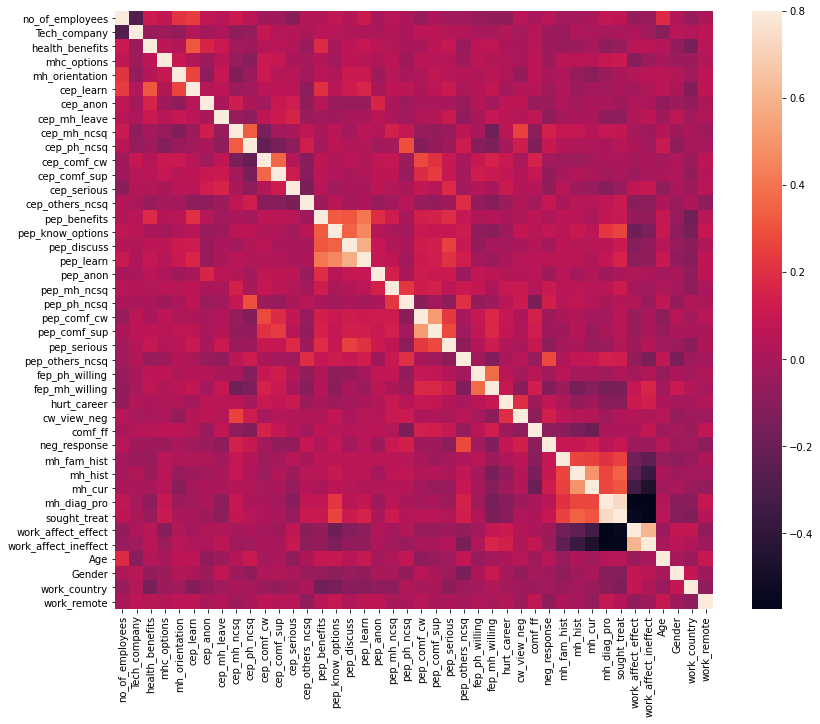

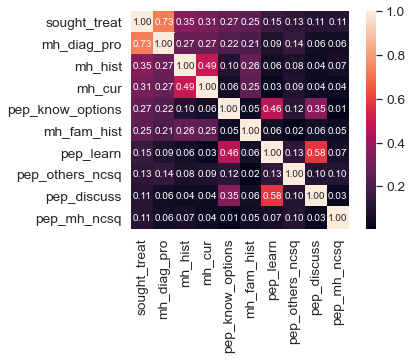

In [25]:
corrmat = data.corr()
f, ax = plt.subplots(figsize=(14, 11))
sns.heatmap(corrmat, vmax=.8, square=True);
plt.show()

k = 10
cols = corrmat.nlargest(k, 'sought_treat')['sought_treat'].index
cm = np.corrcoef(data[cols].values.T)
sns.set(font_scale=1.25)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values)
plt.show()



Text(0.5, 12.199999999999974, 'Age')

<Figure size 864x576 with 0 Axes>

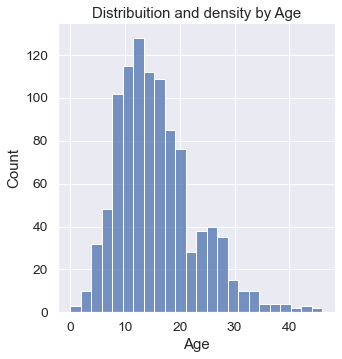

In [26]:
plt.figure(figsize=(12,8))
sns.displot(data["Age"], bins=24)
plt.title("Distribuition and density by Age")
plt.xlabel("Age")

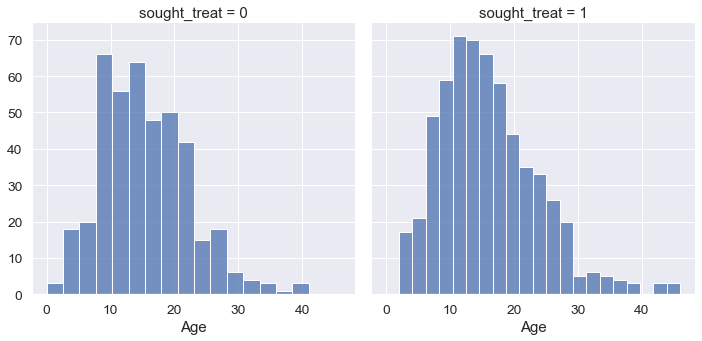

In [27]:
g = sns.FacetGrid(data, col='sought_treat', height=5)
g = g.map(sns.histplot, "Age")

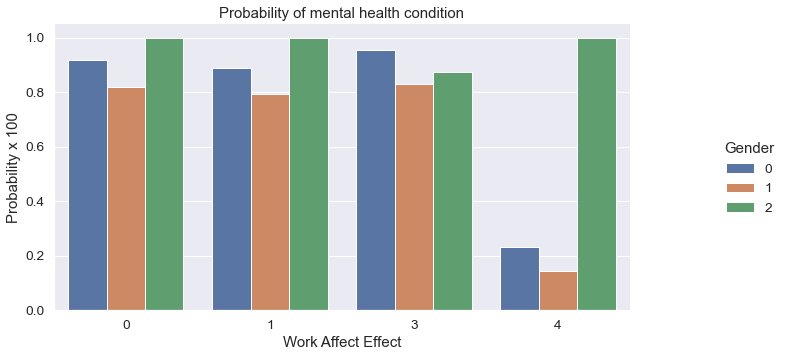

In [28]:
o = labelDict['label_work_affect_effect']
g = sns.catplot(x="work_affect_effect", y="sought_treat", hue="Gender", data=data, kind="bar", ci=None, height=5, aspect=2, legend_out = True)
g.set_xticklabels(o)
plt.title('Probability of mental health condition')
plt.ylabel('Probability x 100')
plt.xlabel('Work Affect Effect')

new_labels = labelDict['label_Gender']
for t, l in zip(g._legend.texts, new_labels): t.set_text(l)

g.fig.subplots_adjust(top=0.9,right=0.8)
plt.show()

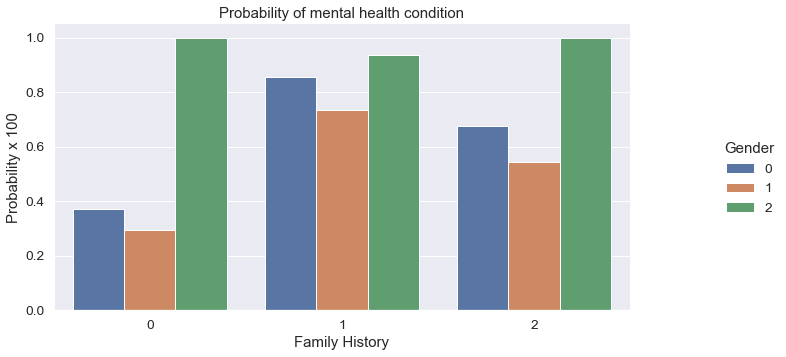

In [29]:
o = labelDict['label_mh_fam_hist']
g = sns.catplot(x="mh_fam_hist", y="sought_treat", hue="Gender", data=data, kind="bar", ci=None, height=5, aspect=2, legend_out = True)
g.set_xticklabels(o)
plt.title('Probability of mental health condition')
plt.ylabel('Probability x 100')
plt.xlabel('Family History')

new_labels = labelDict['label_Gender']
for t, l in zip(g._legend.texts, new_labels): t.set_text(l)

g.fig.subplots_adjust(top=0.9,right=0.8)

plt.show()

In [30]:
scaler = MinMaxScaler()
data['age'] = scaler.fit_transform(data[['Age']])
data.head()

,no_of_employees,Tech_company,health_benefits,mhc_options,mh_orientation,cep_learn,cep_anon,cep_mh_leave,cep_mh_ncsq,cep_ph_ncsq,cep_comf_cw,cep_comf_sup,cep_serious,cep_others_ncsq,pep_benefits,pep_know_options,pep_discuss,pep_learn,pep_anon,pep_mh_ncsq,pep_ph_ncsq,pep_comf_cw,pep_comf_sup,pep_serious,pep_others_ncsq,fep_ph_willing,fep_mh_willing,hurt_career,cw_view_neg,comf_ff,neg_response,mh_fam_hist,mh_hist,mh_cur,mh_diag_pro,sought_treat,work_affect_effect,work_affect_ineffect,Age,Gender,work_country,work_remote,age
0,2,1,0,1,0,0,2,2,0,0,2,1,2,0,0,0,2,0,2,3,0,2,3,2,0,2,2,2,0,3,0,0,1,0,1,0,3,3,21,1,0,2,0.456522
1,1,1,0,1,1,1,1,3,0,0,2,1,1,0,1,1,0,2,1,0,0,0,3,3,0,2,0,0,0,3,0,1,1,1,1,1,0,2,11,1,1,0,0.239130
2,1,1,0,1,0,0,2,4,2,0,2,2,2,0,0,0,0,2,2,2,2,2,2,2,2,1,1,2,2,3,2,0,2,0,0,1,3,3,20,1,0,1,0.434783
4,1,0,1,1,0,0,0,4,1,2,2,0,0,0,2,0,3,0,2,3,2,0,3,3,2,2,0,1,2,3,1,1,1,1,1,1,2,2,25,0,1,2,0.543478
5,5,1,1,2,0,1,1,3,1,1,2,1,0,1,0,1,0,0,2,1,2,0,0,0,2,1,2,1,2,3,1,0,0,1,0,1,3,1,24,1,0,2,0.521739


In [31]:
feature_cols = ['age', 'Gender', 'mh_fam_hist', 'health_benefits', 'mhc_options', 'cep_anon', 'cep_mh_leave', 'work_affect_effect']
X = data[feature_cols]
y = data.sought_treat

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=0)

methodDict = {}
rmseDict = ()

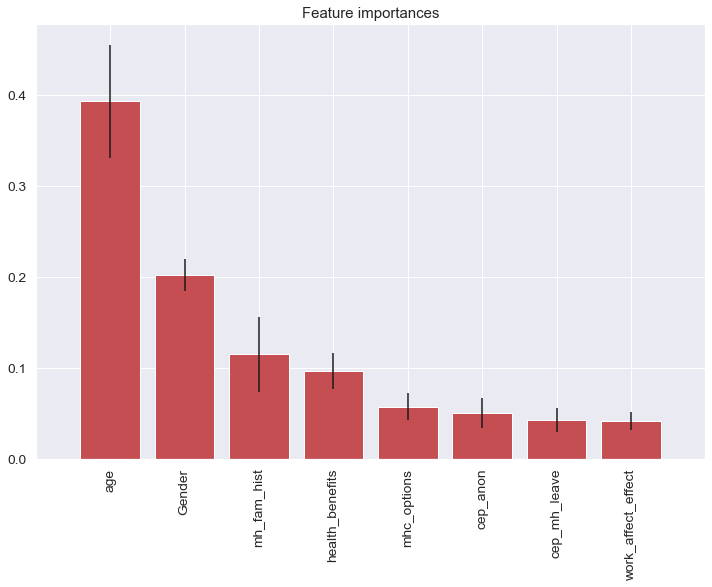

In [32]:
forest = ExtraTreesClassifier(n_estimators=250,
                              random_state=0)

forest.fit(X, y)
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

labels = []
for f in range(X.shape[1]):
    labels.append(feature_cols[f])      
    
plt.figure(figsize=(12,8))
plt.title("Feature importances")
plt.bar(range(X.shape[1]), importances[indices],
       color="r", yerr=std[indices], align="center")
plt.xticks(range(X.shape[1]), labels, rotation='vertical')
plt.xlim([-1, X.shape[1]])
plt.show()

In [33]:
def evalClassModel(model, y_test, y_pred_class, plot=False):
    print('Accuracy:', metrics.accuracy_score(y_test, y_pred_class))
    
    print('Null accuracy:\n', y_test.value_counts())
    
    print('Percentage of ones:', y_test.mean())
    
    print('Percentage of zeros:',1 - y_test.mean())
    
    print('True:', y_test.values[0:25])
    print('Pred:', y_pred_class[0:25])
    
    confusion = metrics.confusion_matrix(y_test, y_pred_class)
    TP = confusion[1, 1]
    TN = confusion[0, 0]
    FP = confusion[0, 1]
    FN = confusion[1, 0]
    
    sns.heatmap(confusion,annot=True,fmt="d") 
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()
    
    accuracy = metrics.accuracy_score(y_test, y_pred_class)
    print('Classification Accuracy:', accuracy)
    
    print('Classification Error:', 1 - metrics.accuracy_score(y_test, y_pred_class))
    
    false_positive_rate = FP / float(TN + FP)
    print('False Positive Rate:', false_positive_rate)
    
    print('Precision:', metrics.precision_score(y_test, y_pred_class))
    
    
    print('AUC Score:', metrics.roc_auc_score(y_test, y_pred_class))
    
    print('Cross-validated AUC:', cross_val_score(model, X, y, cv=10, scoring='roc_auc').mean())
    
    print('First 10 predicted responses:\n', model.predict(X_test)[0:10])

    print('First 10 predicted probabilities of class members:\n', model.predict_proba(X_test)[0:10])

    model.predict_proba(X_test)[0:10, 1]
    
    y_pred_prob = model.predict_proba(X_test)[:, 1]
    
    if plot == True:
        plt.rcParams['font.size'] = 12
        plt.hist(y_pred_prob, bins=8)
        
        plt.xlim(0,1)
        plt.title('Histogram of predicted probabilities')
        plt.xlabel('Predicted probability of treatment')
        plt.ylabel('Frequency')
    
    
    y_pred_prob = y_pred_prob.reshape(-1,1) 
    y_pred_class = binarize(y_pred_prob, 0.3)[0]
    
    print('First 10 predicted probabilities:\n', y_pred_prob[0:10])
    
    roc_auc = metrics.roc_auc_score(y_test, y_pred_prob)
    
    
    fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred_prob)
    if plot == True:
        plt.figure()
        
        plt.plot(fpr, tpr, color='darkorange', label='ROC curve (area = %0.2f)' % roc_auc)
        plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.0])
        plt.rcParams['font.size'] = 12
        plt.title('ROC curve for treatment classifier')
        plt.xlabel('False Positive Rate (1 - Specificity)')
        plt.ylabel('True Positive Rate (Sensitivity)')
        plt.legend(loc="lower right")
        plt.show()
    
    def evaluate_threshold(threshold):
        print('Specificity for ' + str(threshold) + ' :', 1 - fpr[thresholds > threshold][-1])

    predict_mine = np.where(y_pred_prob > 0.50, 1, 0)
    confusion = metrics.confusion_matrix(y_test, predict_mine)
    print(confusion)
    
    
    
    return accuracy

In [34]:
def tuningCV(knn):
    
    k_range = list(range(1, 31))
    k_scores = []
    for k in k_range:
        knn = KNeighborsClassifier(n_neighbors=k)
        scores = cross_val_score(knn, X, y, cv=10, scoring='accuracy')
        k_scores.append(scores.mean())
    print(k_scores)
    plt.plot(k_range, k_scores)
    plt.xlabel('Value of K for KNN')
    plt.ylabel('Cross-Validated Accuracy')
    plt.show()

In [35]:
def tuningGridSerach(knn):
    k_range = list(range(1, 31))
    print(k_range)
    
    param_grid = dict(n_neighbors=k_range)
    print(param_grid)
    
    grid = GridSearchCV(knn, param_grid, cv=10, scoring='accuracy')

    grid.fit(X, y)
    
    grid.grid_scores_
    
    print(grid.grid_scores_[0].parameters)
    print(grid.grid_scores_[0].cv_validation_scores)
    print(grid.grid_scores_[0].mean_validation_score)
    
    grid_mean_scores = [result.mean_validation_score for result in grid.cv_results_]
    print(grid_mean_scores)
    
    plt.plot(k_range, grid_mean_scores)
    plt.xlabel('Value of K for KNN')
    plt.ylabel('Cross-Validated Accuracy')
    plt.show()
    
    print('GridSearch best score', grid.best_score_)
    print('GridSearch best params', grid.best_params_)
    print('GridSearch best estimator', grid.best_estimator_)

In [36]:
def tuningMultParam(knn):
    
    k_range = list(range(1, 31))
    weight_options = ['uniform', 'distance']
        
    param_grid = dict(n_neighbors=k_range, weights=weight_options)
    print(param_grid) 
    
    grid = GridSearchCV(knn, param_grid, cv=10, scoring='accuracy')
    grid.fit(X, y) 
    
    print(grid.cv_results_)
    
    print('Multiparam. Best Score: ', grid.best_score_)
    print('Multiparam. Best Params: ', grid.best_params_)

In [37]:
def tuningRandomizedSearchCV(model, param_dist):
    rand = RandomizedSearchCV(model, param_dist, cv=10, scoring='accuracy', n_iter=10, random_state=5)
    rand.fit(X, y)
    rand.cv_results_
    
    print('Rand. Best Score: ', rand.best_score_)
    print('Rand. Best Params: ', rand.best_params_)
    
    best_scores = []
    for _ in range(20):
        rand = RandomizedSearchCV(model, param_dist, cv=10, scoring='accuracy', n_iter=10)
        rand.fit(X, y)
        best_scores.append(round(rand.best_score_, 3))
    print(best_scores)

In [38]:
def treeClassifier():
    tree = DecisionTreeClassifier()
    featuresSize = feature_cols.__len__()
    param_dist = {"max_depth": [3, None],
              "max_features": randint(1, featuresSize),
              "min_samples_split": randint(2, 9),
              "min_samples_leaf": randint(1, 9),
              "criterion": ["gini", "entropy"]}
    tuningRandomizedSearchCV(tree, param_dist)

    tree = DecisionTreeClassifier(max_depth=3, min_samples_split=10, max_features=8, criterion='entropy', min_samples_leaf=9)
    tree.fit(X_train, y_train)
    
    y_pred_class = tree.predict(X_test)
    
    print('########### Tree classifier ###############')
    
    accuracy_score = evalClassModel(tree, y_test, y_pred_class, True)

    methodDict['Tree clas.'] = accuracy_score * 100

Rand. Best Score:  0.8452630557173364
Rand. Best Params:  {'criterion': 'entropy', 'max_depth': 3, 'max_features': 7, 'min_samples_leaf': 6, 'min_samples_split': 4}
[0.827, 0.845, 0.845, 0.845, 0.842, 0.841, 0.84, 0.84, 0.846, 0.844, 0.84, 0.838, 0.846, 0.845, 0.845, 0.836, 0.842, 0.845, 0.846, 0.84]
########### Tree classifier ###############
Accuracy: 0.8557377049180328
Null accuracy:
 1    175
0    130
Name: sought_treat, dtype: int64
Percentage of ones: 0.5737704918032787
Percentage of zeros: 0.42622950819672134
True: [1 0 1 0 1 1 1 1 0 0 1 0 0 1 0 1 1 0 0 1 0 1 1 0 0]
Pred: [0 0 1 1 1 1 1 1 0 0 1 0 0 1 1 1 1 0 0 1 0 1 1 0 0]


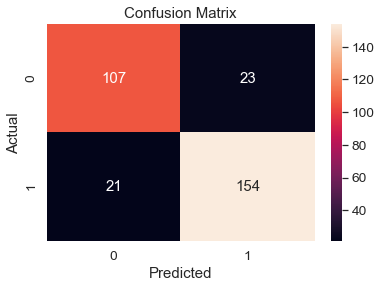

Classification Accuracy: 0.8557377049180328
Classification Error: 0.1442622950819672
False Positive Rate: 0.17692307692307693
Precision: 0.8700564971751412
AUC Score: 0.8515384615384615
Cross-validated AUC: 0.8773566162719739
First 10 predicted responses:
 [0 0 1 1 1 1 1 1 0 0]
First 10 predicted probabilities of class members:
 [[0.55555556 0.44444444]
 [0.77272727 0.22727273]
 [0.20212766 0.79787234]
 [0.20212766 0.79787234]
 [0.08108108 0.91891892]
 [0.08108108 0.91891892]
 [0.08108108 0.91891892]
 [0.08108108 0.91891892]
 [1.         0.        ]
 [0.9122807  0.0877193 ]]
First 10 predicted probabilities:
 [[0.44444444]
 [0.22727273]
 [0.79787234]
 [0.79787234]
 [0.91891892]
 [0.91891892]
 [0.91891892]
 [0.91891892]
 [0.        ]
 [0.0877193 ]]


C:\Users\Gloria Okpakpa\anaconda3\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass threshold=0.3 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


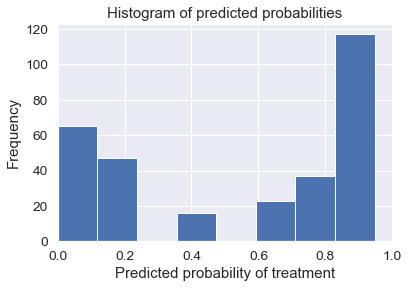

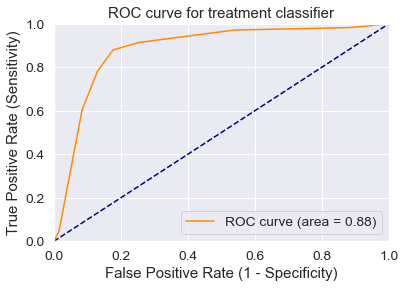

[[107  23]
 [ 21 154]]


In [39]:
treeClassifier()

In [40]:
def randomForest():
    forest = RandomForestClassifier(n_estimators = 40)

    featuresSize = feature_cols.__len__()
    param_dist = {"max_depth": [3, None],
              "max_features": randint(1, featuresSize),
              "min_samples_split": randint(2, 9),
              "min_samples_leaf": randint(1, 9),
              "criterion": ["gini", "entropy"]}
    tuningRandomizedSearchCV(forest, param_dist)
    
    forest = RandomForestClassifier(max_depth = None, min_samples_leaf=6, min_samples_split=2, n_estimators = 40, random_state = 1)
    my_forest = forest.fit(X_train, y_train)

    y_pred_class = my_forest.predict(X_test)
    
    print('########### Random Forests ###############')
    
    accuracy_score = evalClassModel(my_forest, y_test, y_pred_class, True)

    methodDict['R. Forest'] = accuracy_score * 100

Rand. Best Score:  0.8472238400310619
Rand. Best Params:  {'criterion': 'entropy', 'max_depth': 3, 'max_features': 7, 'min_samples_leaf': 1, 'min_samples_split': 6}
[0.847, 0.845, 0.846, 0.847, 0.847, 0.847, 0.846, 0.846, 0.845, 0.847, 0.847, 0.847, 0.847, 0.846, 0.847, 0.847, 0.847, 0.847, 0.849, 0.847]
########### Random Forests ###############
Accuracy: 0.8524590163934426
Null accuracy:
 1    175
0    130
Name: sought_treat, dtype: int64
Percentage of ones: 0.5737704918032787
Percentage of zeros: 0.42622950819672134
True: [1 0 1 0 1 1 1 1 0 0 1 0 0 1 0 1 1 0 0 1 0 1 1 0 0]
Pred: [0 0 1 1 1 1 1 1 0 0 1 0 0 1 1 1 1 0 0 1 0 1 1 0 0]


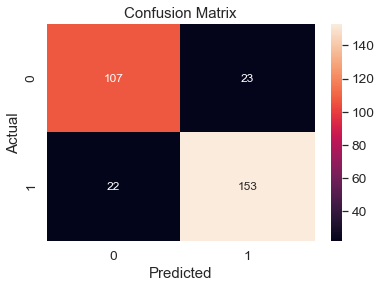

Classification Accuracy: 0.8524590163934426
Classification Error: 0.14754098360655743
False Positive Rate: 0.17692307692307693
Precision: 0.8693181818181818
AUC Score: 0.8486813186813187
Cross-validated AUC: 0.8920025164537361
First 10 predicted responses:
 [0 0 1 1 1 1 1 1 0 0]
First 10 predicted probabilities of class members:
 [[0.65971704 0.34028296]
 [0.76302677 0.23697323]
 [0.29142186 0.70857814]
 [0.29167559 0.70832441]
 [0.08307374 0.91692626]
 [0.12060573 0.87939427]
 [0.06572186 0.93427814]
 [0.03661135 0.96338865]
 [0.91669437 0.08330563]
 [0.9388712  0.0611288 ]]
First 10 predicted probabilities:
 [[0.34028296]
 [0.23697323]
 [0.70857814]
 [0.70832441]
 [0.91692626]
 [0.87939427]
 [0.93427814]
 [0.96338865]
 [0.08330563]
 [0.0611288 ]]


C:\Users\Gloria Okpakpa\anaconda3\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass threshold=0.3 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


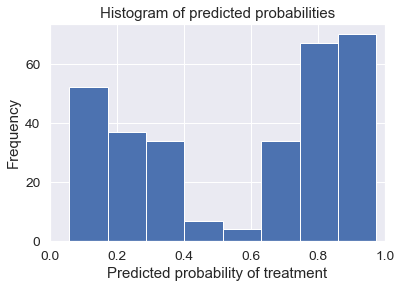

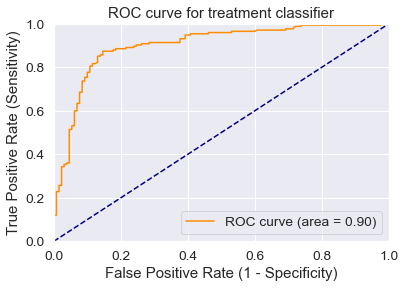

[[107  23]
 [ 22 153]]


In [41]:
randomForest()

In [42]:
def Knn():
    knn = KNeighborsClassifier(n_neighbors=5)
    
    k_range = list(range(1, 31))
    weight_options = ['uniform', 'distance']
    
    param_dist = dict(n_neighbors=k_range, weights=weight_options)
    tuningRandomizedSearchCV(knn, param_dist)
    
    knn = KNeighborsClassifier(n_neighbors=27, weights='uniform')
    knn.fit(X_train, y_train)
    
    y_pred_class = knn.predict(X_test)
    
    print('########### KNeighborsClassifier ###############')
    
    accuracy_score = evalClassModel(knn, y_test, y_pred_class, True)

    methodDict['KNN'] = accuracy_score * 100

Rand. Best Score:  0.8305086390992041
Rand. Best Params:  {'weights': 'uniform', 'n_neighbors': 15}
[0.828, 0.831, 0.833, 0.831, 0.831, 0.831, 0.828, 0.83, 0.831, 0.832, 0.83, 0.83, 0.832, 0.832, 0.833, 0.833, 0.831, 0.831, 0.832, 0.833]
########### KNeighborsClassifier ###############
Accuracy: 0.8459016393442623
Null accuracy:
 1    175
0    130
Name: sought_treat, dtype: int64
Percentage of ones: 0.5737704918032787
Percentage of zeros: 0.42622950819672134
True: [1 0 1 0 1 1 1 1 0 0 1 0 0 1 0 1 1 0 0 1 0 1 1 0 0]
Pred: [0 0 1 1 1 1 1 1 0 0 1 0 0 1 1 1 1 0 0 1 0 1 1 0 0]


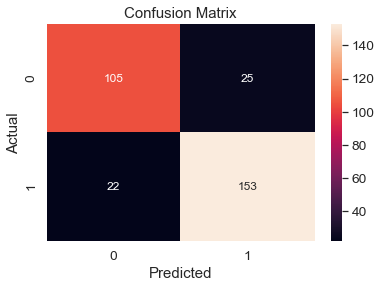

Classification Accuracy: 0.8459016393442623
Classification Error: 0.15409836065573768
False Positive Rate: 0.19230769230769232
Precision: 0.8595505617977528
AUC Score: 0.840989010989011
Cross-validated AUC: 0.8761891802332068
First 10 predicted responses:
 [0 0 1 1 1 1 1 1 0 0]
First 10 predicted probabilities of class members:
 [[0.66666667 0.33333333]
 [0.77777778 0.22222222]
 [0.18518519 0.81481481]
 [0.33333333 0.66666667]
 [0.11111111 0.88888889]
 [0.07407407 0.92592593]
 [0.18518519 0.81481481]
 [0.07407407 0.92592593]
 [0.85185185 0.14814815]
 [0.92592593 0.07407407]]
First 10 predicted probabilities:
 [[0.33333333]
 [0.22222222]
 [0.81481481]
 [0.66666667]
 [0.88888889]
 [0.92592593]
 [0.81481481]
 [0.92592593]
 [0.14814815]
 [0.07407407]]


C:\Users\Gloria Okpakpa\anaconda3\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass threshold=0.3 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


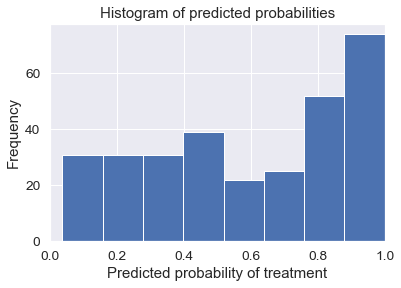

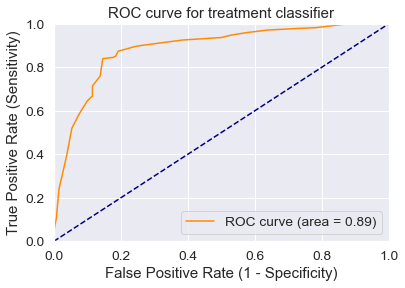

[[105  25]
 [ 22 153]]


In [43]:
Knn()

In [44]:
def logisticRegression():
    logreg = LogisticRegression()
    logreg.fit(X_train, y_train)
    
    y_pred_class = logreg.predict(X_test)
    
    print('########### Logistic Regression ###############')
    
    accuracy_score = evalClassModel(logreg, y_test, y_pred_class, True)
    
    methodDict['Log. Regres.'] = accuracy_score * 100

########### Logistic Regression ###############
Accuracy: 0.819672131147541
Null accuracy:
 1    175
0    130
Name: sought_treat, dtype: int64
Percentage of ones: 0.5737704918032787
Percentage of zeros: 0.42622950819672134
True: [1 0 1 0 1 1 1 1 0 0 1 0 0 1 0 1 1 0 0 1 0 1 1 0 0]
Pred: [0 0 1 1 1 1 1 1 0 0 0 0 0 1 1 1 1 0 0 1 0 1 1 0 0]


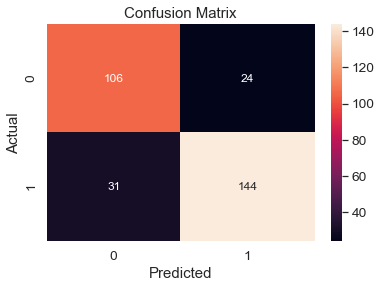

Classification Accuracy: 0.819672131147541
Classification Error: 0.180327868852459
False Positive Rate: 0.18461538461538463
Precision: 0.8571428571428571
AUC Score: 0.8191208791208792
Cross-validated AUC: 0.8484985596829334
First 10 predicted responses:
 [0 0 1 1 1 1 1 1 0 0]
First 10 predicted probabilities of class members:
 [[0.5592937  0.4407063 ]
 [0.68372539 0.31627461]
 [0.08808645 0.91191355]
 [0.04898989 0.95101011]
 [0.08835407 0.91164593]
 [0.09138043 0.90861957]
 [0.43252471 0.56747529]
 [0.36961695 0.63038305]
 [0.84449332 0.15550668]
 [0.84800365 0.15199635]]
First 10 predicted probabilities:
 [[0.4407063 ]
 [0.31627461]
 [0.91191355]
 [0.95101011]
 [0.91164593]
 [0.90861957]
 [0.56747529]
 [0.63038305]
 [0.15550668]
 [0.15199635]]


C:\Users\Gloria Okpakpa\anaconda3\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass threshold=0.3 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


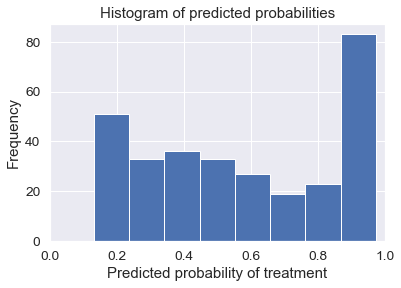

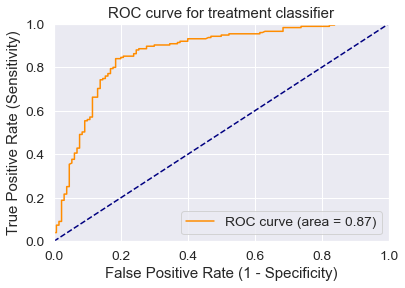

[[106  24]
 [ 31 144]]


In [45]:
logisticRegression()

In [46]:
def boosting():
    clf = DecisionTreeClassifier(criterion='entropy', max_depth=1)
    boost = AdaBoostClassifier(base_estimator=clf, n_estimators=500)
    boost.fit(X_train, y_train)
    
    y_pred_class = boost.predict(X_test)
    
    print('########### Boosting ###############')
    
    accuracy_score = evalClassModel(boost, y_test, y_pred_class, True)

    methodDict['Boosting'] = accuracy_score * 100

########### Boosting ###############
Accuracy: 0.8524590163934426
Null accuracy:
 1    175
0    130
Name: sought_treat, dtype: int64
Percentage of ones: 0.5737704918032787
Percentage of zeros: 0.42622950819672134
True: [1 0 1 0 1 1 1 1 0 0 1 0 0 1 0 1 1 0 0 1 0 1 1 0 0]
Pred: [0 0 1 1 1 1 1 1 0 0 1 0 0 1 1 1 1 0 0 1 0 1 1 0 0]


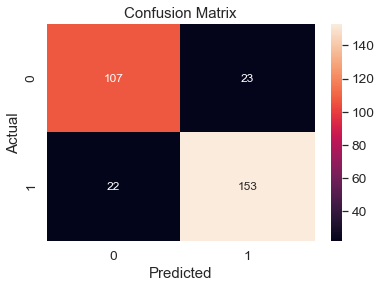

Classification Accuracy: 0.8524590163934426
Classification Error: 0.14754098360655743
False Positive Rate: 0.17692307692307693
Precision: 0.8693181818181818
AUC Score: 0.8486813186813187
Cross-validated AUC: 0.8680823933541998
First 10 predicted responses:
 [0 0 1 1 1 1 1 1 0 0]
First 10 predicted probabilities of class members:
 [[0.50046273 0.49953727]
 [0.50069609 0.49930391]
 [0.49835365 0.50164635]
 [0.49997055 0.50002945]
 [0.49849781 0.50150219]
 [0.49936602 0.50063398]
 [0.49796325 0.50203675]
 [0.49856907 0.50143093]
 [0.501881   0.498119  ]
 [0.50162051 0.49837949]]
First 10 predicted probabilities:
 [[0.49953727]
 [0.49930391]
 [0.50164635]
 [0.50002945]
 [0.50150219]
 [0.50063398]
 [0.50203675]
 [0.50143093]
 [0.498119  ]
 [0.49837949]]


C:\Users\Gloria Okpakpa\anaconda3\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass threshold=0.3 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


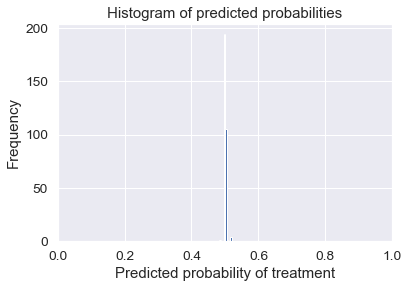

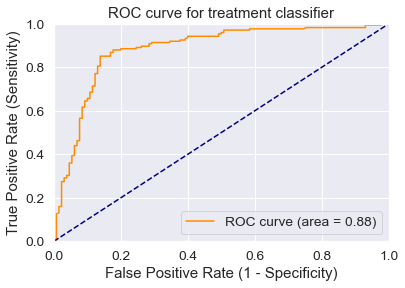

[[107  23]
 [ 22 153]]


In [47]:
boosting()

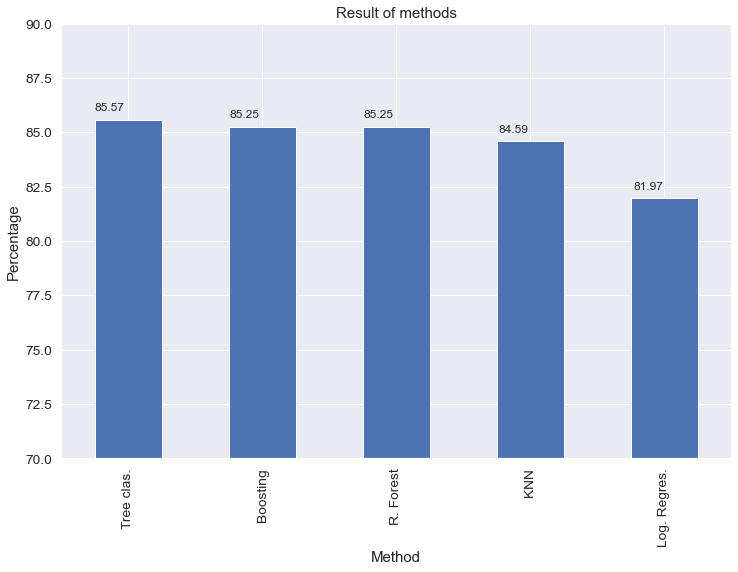

In [48]:
def plotResult():
    s = pd.Series(methodDict)
    s = s.sort_values(ascending=False)
    plt.figure(figsize=(12,8))
    ax = s.plot(kind='bar') 
    for p in ax.patches:
        ax.annotate(str(round(p.get_height(),2)), (p.get_x() * 1.005, p.get_height() * 1.005))
    plt.ylim([70.0, 90.0])
    plt.xlabel('Method')
    plt.ylabel('Percentage')
    plt.title('Result of methods')
     
    plt.show()
plotResult()